In [17]:
from __future__ import print_function, division

from keras.layers import Input, Dense, Flatten, Dropout, Reshape, Concatenate
from keras.layers import BatchNormalization, Activation, Conv2D, Conv2DTranspose
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Model
from keras.optimizers import Adam

from keras.datasets import cifar10
import keras.backend as K

import matplotlib.pyplot as plt

import sys
import numpy as np
import time
from google.colab import files

%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [0]:
def get_generator(input_layer, condition_layer):

  merged_input = Concatenate()([input_layer, condition_layer])
  
  hid = Dense(128 * 8 * 8, activation='relu')(merged_input)    
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Reshape((8, 8, 128))(hid)

  hid = Conv2D(128, kernel_size=4, strides=1,padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)    
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2DTranspose(128, 4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=5, strides=1,padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)    
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2DTranspose(128, 4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
                      
  hid = Conv2D(3, kernel_size=5, strides=1, padding="same")(hid)
  out = Activation("tanh")(hid)

  model = Model(inputs=[input_layer, condition_layer], outputs=out)
  model.summary()
  
  return model, out


In [0]:
def get_discriminator(input_layer, condition_layer):
  hid = Conv2D(128, kernel_size=3, strides=1, padding='same')(input_layer)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Flatten()(hid)
  
  merged_layer = Concatenate()([hid, condition_layer])
  hid = Dense(512, activation='relu')(merged_layer)
  #hid = Dropout(0.4)(hid)
  out = Dense(1, activation='sigmoid')(hid)

  model = Model(inputs=[input_layer, condition_layer], outputs=out)

  model.summary()

  return model, out

In [0]:
from keras.preprocessing import image

def one_hot_encode(y):
  z = np.zeros((len(y), 10))
  idx = np.arange(len(y))
  z[idx, y] = 1
  return z

def generate_noise(n_samples, noise_dim):
  X = np.random.normal(0, 1, size=(n_samples, noise_dim))
  return X

def generate_random_labels(n):
  y = np.random.choice(10, n)
  y = one_hot_encode(y)
  return y

tags = ['Airplane', 'Automobile', 'Bird', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']
  
def show_samples(batchidx):
  fig, axs = plt.subplots(5, 6, figsize=(10,6))
  plt.subplots_adjust(hspace=0.3, wspace=0.1)
  #fig, axs = plt.subplots(5, 6)
  #fig.tight_layout()
  for classlabel in range(10):
    row = int(classlabel / 2)
    coloffset = (classlabel % 2) * 3
    lbls = one_hot_encode([classlabel] * 3)
    noise = generate_noise(3, 100)
    gen_imgs = generator.predict([noise, lbls])

    for i in range(3):
        # Dont scale the images back, let keras handle it
        img = image.array_to_img(gen_imgs[i], scale=True)
        axs[row,i+coloffset].imshow(img)
        axs[row,i+coloffset].axis('off')
        if i ==1:
          axs[row,i+coloffset].set_title(tags[classlabel])
  plt.show()
  plt.close()  

In [5]:
# GAN creation
img_input = Input(shape=(32,32,3))
disc_condition_input = Input(shape=(10,))

discriminator, disc_out = get_discriminator(img_input, disc_condition_input)
discriminator.compile(optimizer=Adam(0.0002, 0.5), loss='binary_crossentropy', metrics=['accuracy'])

discriminator.trainable = False

noise_input = Input(shape=(100,))
gen_condition_input = Input(shape=(10,))
generator, gen_out = get_generator(noise_input, gen_condition_input)

gan_input = Input(shape=(100,))
x = generator([gan_input, gen_condition_input])
gan_out = discriminator([x, disc_condition_input])
gan = Model(inputs=[gan_input, gen_condition_input, disc_condition_input], output=gan_out)
gan.summary()

gan.compile(optimizer=Adam(0.0002, 0.5), loss='binary_crossentropy')

Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 128)  3584        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 32, 32, 128)  512         conv2d_1[0][0]                   
__________________________________________________________________________________________________
leaky_re_lu_1 (LeakyReLU)       (None, 32, 32, 128)  0           batch_normalization_1[0][0]      
_____________________________________

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:16: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("mo..., inputs=[<tf.Tenso...)`
  app.launch_new_instance()


In [6]:
BATCH_SIZE = 16

# # Get training images
(X_train, y_train), (X_test, _) = cifar10.load_data()

# Normalize data
X_train = (X_train - 127.5) / 127.5

# 1hot encode labels
y_train = one_hot_encode(y_train[:,0])

print ("Training shape: {}".format(X_train.shape))
 
num_batches = int(X_train.shape[0]/BATCH_SIZE)

170508288/170498071 [==============================] - 179s 1us/step
Training shape: (50000, 32, 32, 3)


In [0]:
# Array to store samples for experience replay
exp_replay = []

	Epoch: 1, Generator Loss: 0.00163734273314, Discriminator Loss: [0.0011935 0.       ], Time: 2.0016617775


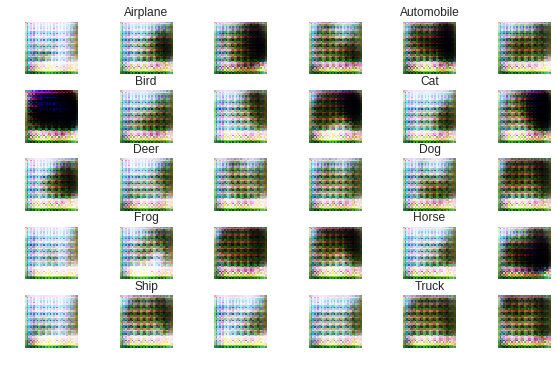

	Epoch: 2, Generator Loss: 0.014212453537, Discriminator Loss: [0.00126008 0.        ], Time: 5.16996383667


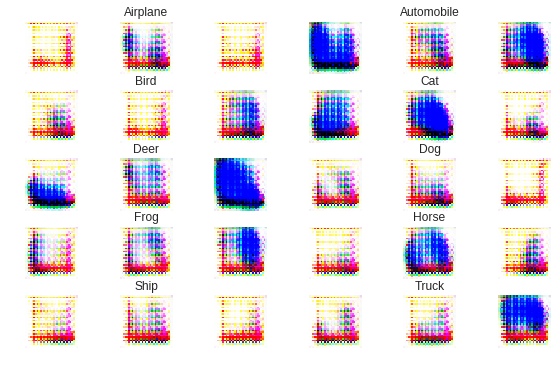

	Epoch: 3, Generator Loss: 0.00961635454178, Discriminator Loss: [0.00120876 0.        ], Time: 8.32267594337


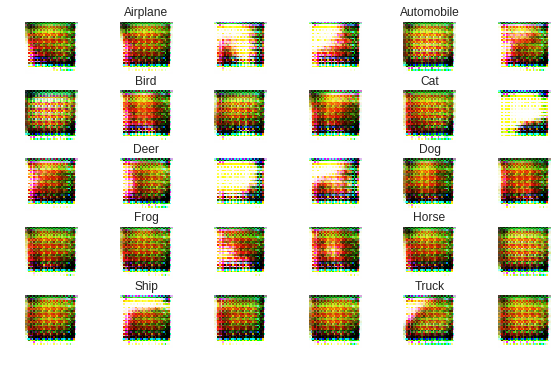

	Epoch: 4, Generator Loss: 0.0123354067612, Discriminator Loss: [0.00115407 0.        ], Time: 11.4680769444


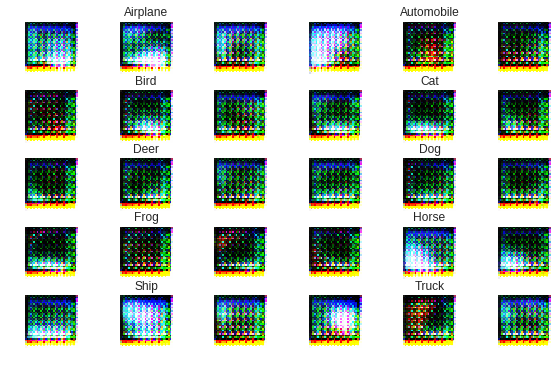

	Epoch: 5, Generator Loss: 0.0167315834808, Discriminator Loss: [0.00135457 0.        ], Time: 14.891810894


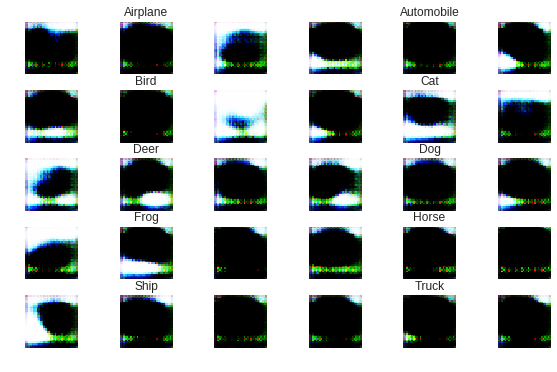

	Epoch: 6, Generator Loss: 0.0103451885986, Discriminator Loss: [0.00126587 0.        ], Time: 18.0300738811


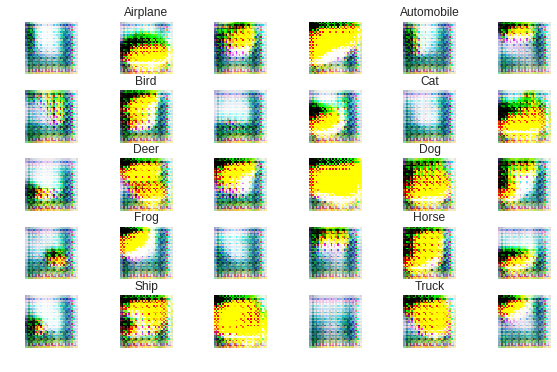

	Epoch: 7, Generator Loss: 0.0117444791031, Discriminator Loss: [0.0012534 0.       ], Time: 21.1956148148


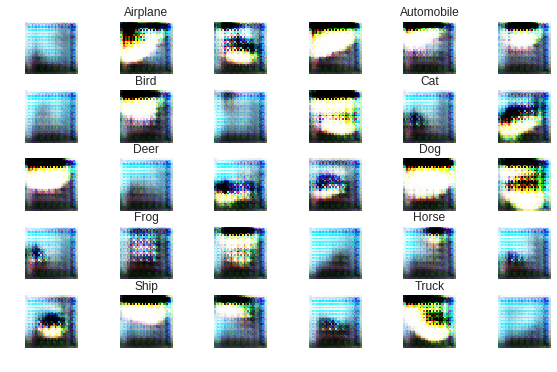

	Epoch: 8, Generator Loss: 0.0093462131691, Discriminator Loss: [0.0020438 0.       ], Time: 24.6041748524


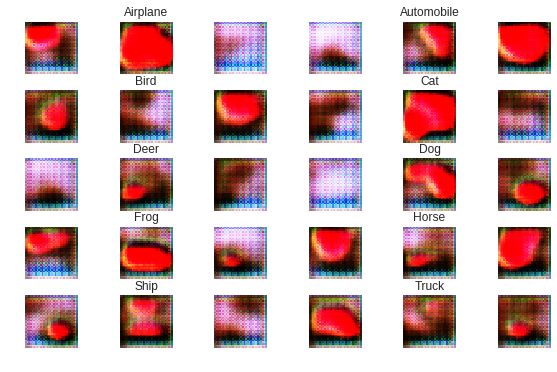

	Epoch: 9, Generator Loss: 0.0118931267166, Discriminator Loss: [0.00149197 0.        ], Time: 27.7620258331


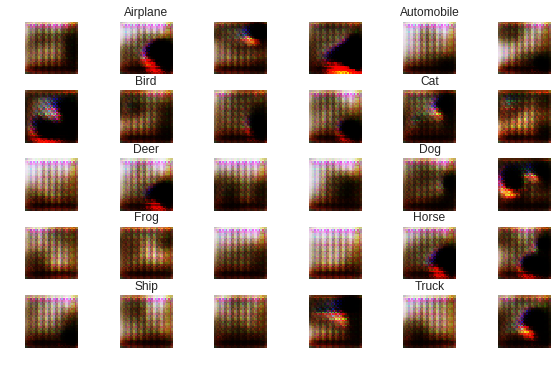

	Epoch: 10, Generator Loss: 0.00484705729008, Discriminator Loss: [0.00135491 0.        ], Time: 30.9174878597


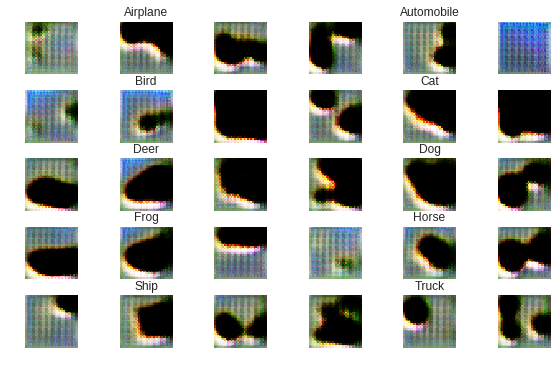

	Epoch: 11, Generator Loss: 0.00709699829102, Discriminator Loss: [0.00152663 0.        ], Time: 34.3609199524


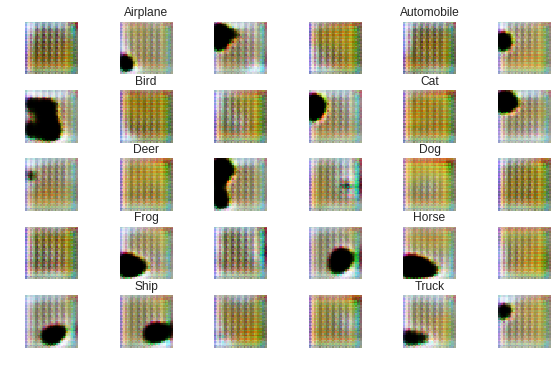

	Epoch: 12, Generator Loss: 0.0103287072182, Discriminator Loss: [0.00172871 0.        ], Time: 37.5099418163


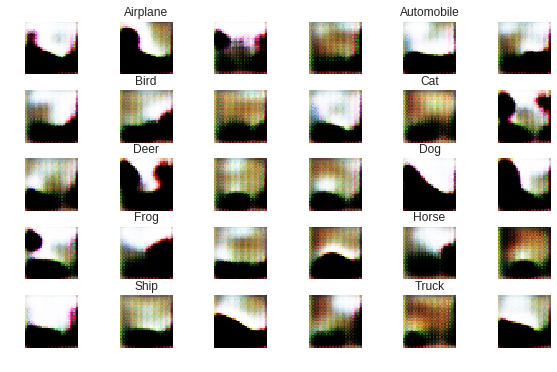

	Epoch: 13, Generator Loss: 0.00739459886551, Discriminator Loss: [0.00131183 0.        ], Time: 40.648473978


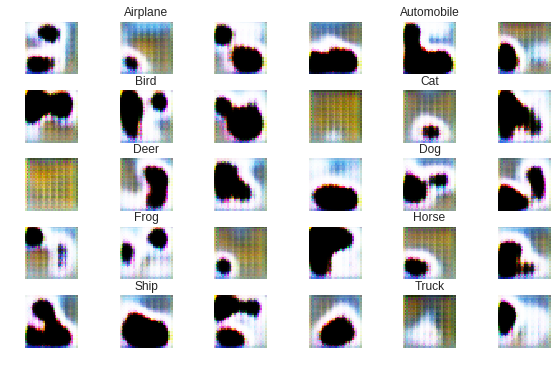

	Epoch: 14, Generator Loss: 0.00765080587387, Discriminator Loss: [0.00127931 0.        ], Time: 43.8024549484


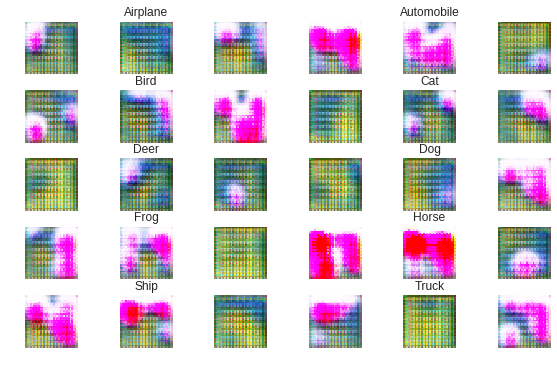

	Epoch: 15, Generator Loss: 0.0119376924133, Discriminator Loss: [0.00147761 0.        ], Time: 47.2496497631


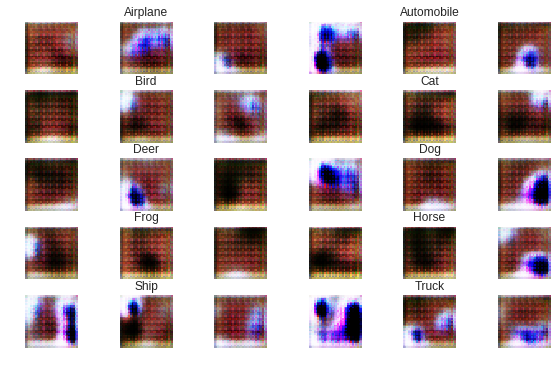

	Epoch: 16, Generator Loss: 0.0122810278702, Discriminator Loss: [0.00141264 0.        ], Time: 50.4158639908


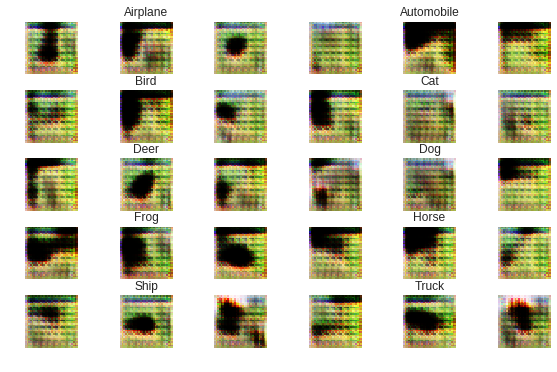

	Epoch: 17, Generator Loss: 0.0128216471863, Discriminator Loss: [0.00129964 0.        ], Time: 53.5755159855


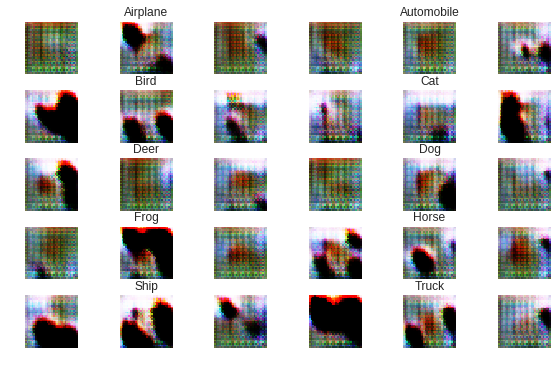

	Epoch: 18, Generator Loss: 0.0122688988876, Discriminator Loss: [0.00157177 0.        ], Time: 57.0079419613


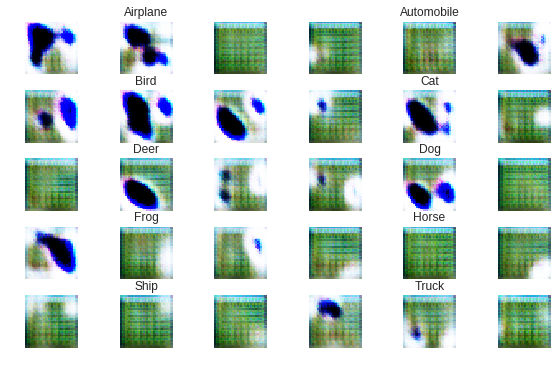

	Epoch: 19, Generator Loss: 0.0104666437912, Discriminator Loss: [0.0015513 0.       ], Time: 60.165779829


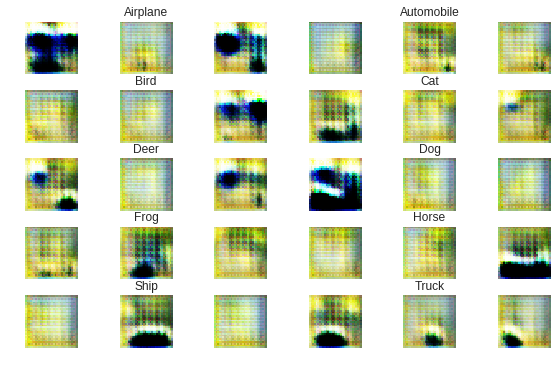

	Epoch: 20, Generator Loss: 0.00733891147614, Discriminator Loss: [0.00127774 0.        ], Time: 63.3325278759


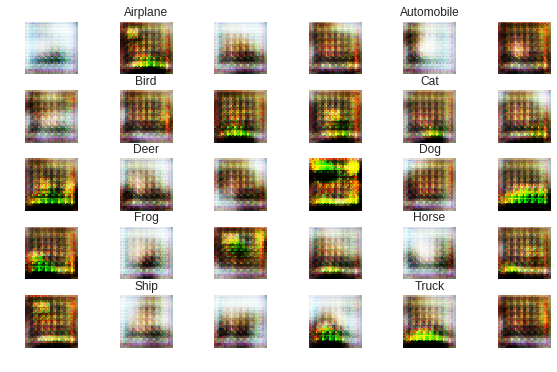

	Epoch: 21, Generator Loss: 0.00968048931122, Discriminator Loss: [0.00140591 0.        ], Time: 66.786290884


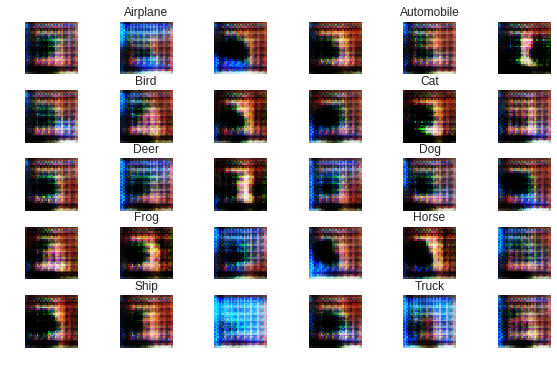

	Epoch: 22, Generator Loss: 0.0122571604919, Discriminator Loss: [0.0011518 0.       ], Time: 69.9396879673


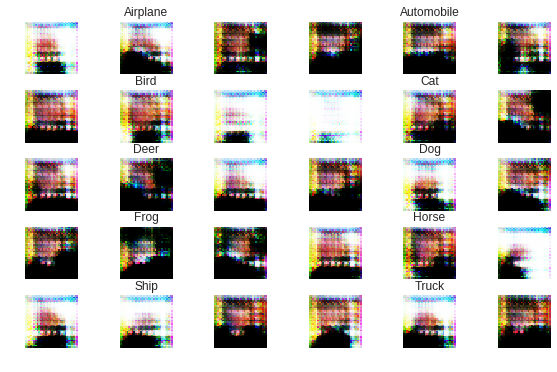

	Epoch: 23, Generator Loss: 0.0123983021355, Discriminator Loss: [0.00143762 0.        ], Time: 73.1049427986


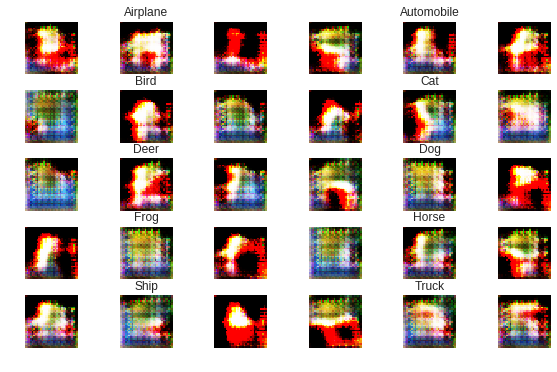

	Epoch: 24, Generator Loss: 0.0101408120346, Discriminator Loss: [0.00124907 0.        ], Time: 76.2561678886


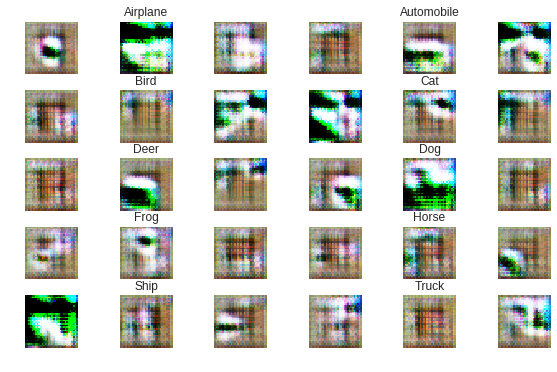

	Epoch: 25, Generator Loss: 0.0102660077286, Discriminator Loss: [0.00130754 0.        ], Time: 79.7202279568


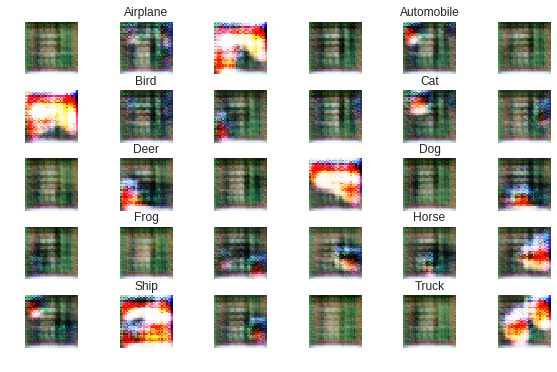

	Epoch: 26, Generator Loss: 0.0117669110584, Discriminator Loss: [0.00123387 0.        ], Time: 82.8833229542


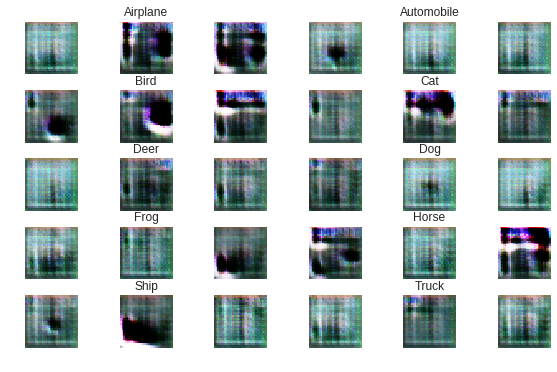

	Epoch: 27, Generator Loss: 0.00343060394287, Discriminator Loss: [0.00113696 0.        ], Time: 86.0342707634


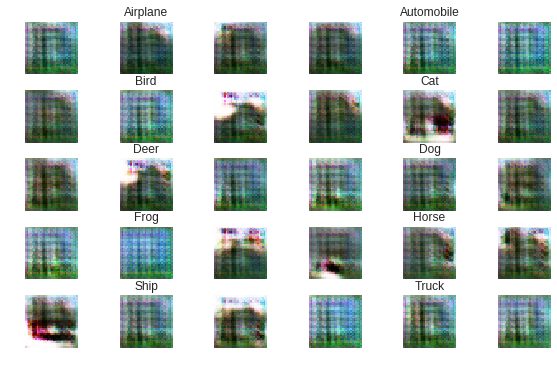

	Epoch: 28, Generator Loss: 0.00501753678322, Discriminator Loss: [0.00119312 0.        ], Time: 89.45667696


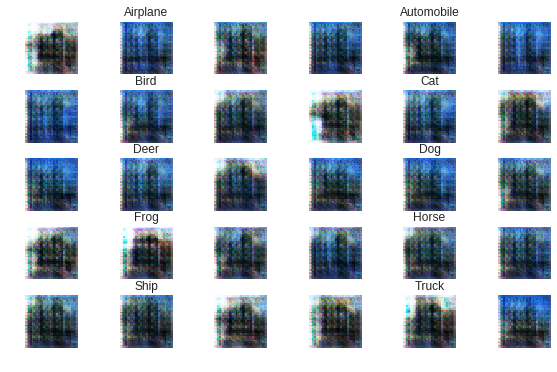

	Epoch: 29, Generator Loss: 0.0038326927042, Discriminator Loss: [0.0011346 0.       ], Time: 92.6022868156


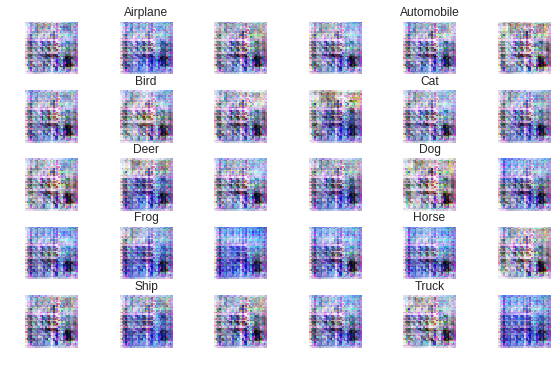

	Epoch: 30, Generator Loss: 0.0138709183502, Discriminator Loss: [0.00124658 0.        ], Time: 95.7713348866


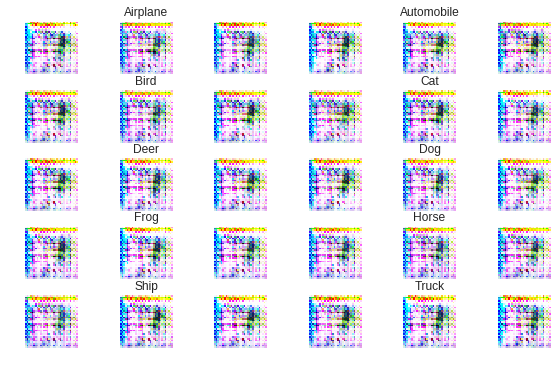

	Epoch: 31, Generator Loss: 0.0143376755524, Discriminator Loss: [0.0010525 0.       ], Time: 99.2553699017


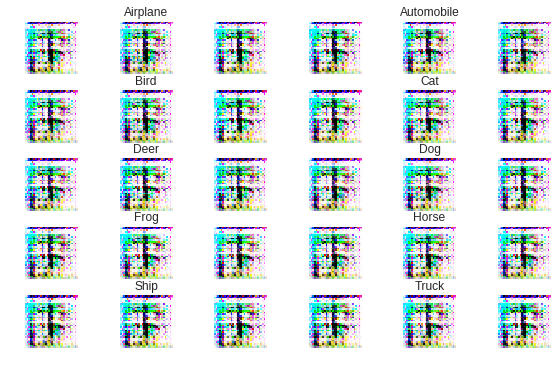

	Epoch: 32, Generator Loss: 0.0150602584076, Discriminator Loss: [0.00099519 0.        ], Time: 102.423028946


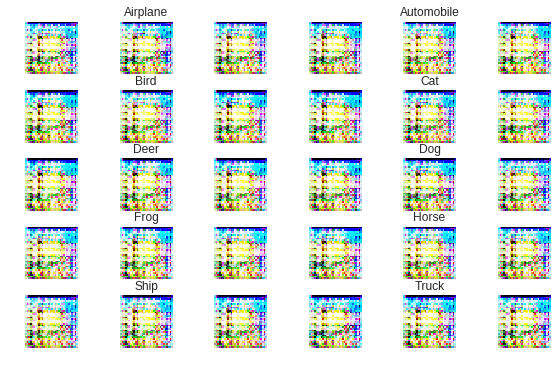

	Epoch: 33, Generator Loss: 0.0159243302917, Discriminator Loss: [0.00102333 0.        ], Time: 105.596358776


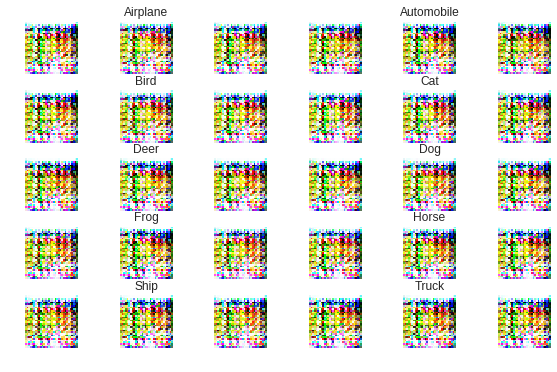

	Epoch: 34, Generator Loss: 0.0173512302399, Discriminator Loss: [0.0010035 0.       ], Time: 108.743089914


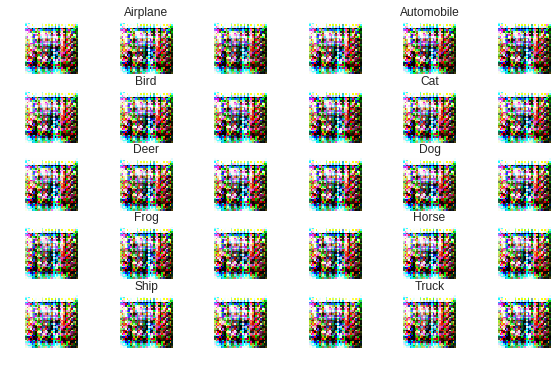

	Epoch: 35, Generator Loss: 0.0170708763123, Discriminator Loss: [0.00114386 0.        ], Time: 112.217411995


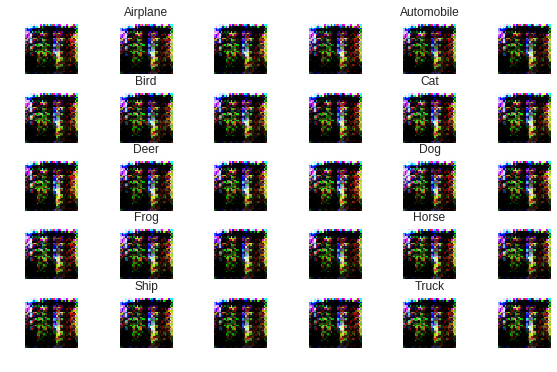

	Epoch: 36, Generator Loss: 0.0144841891479, Discriminator Loss: [0.00102741 0.        ], Time: 115.380105972


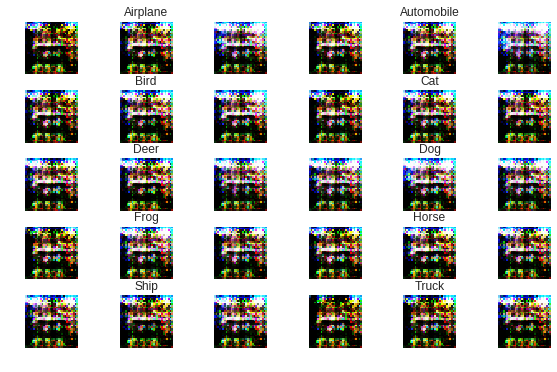

	Epoch: 37, Generator Loss: 0.0108247912979, Discriminator Loss: [0.00118875 0.        ], Time: 118.550281763


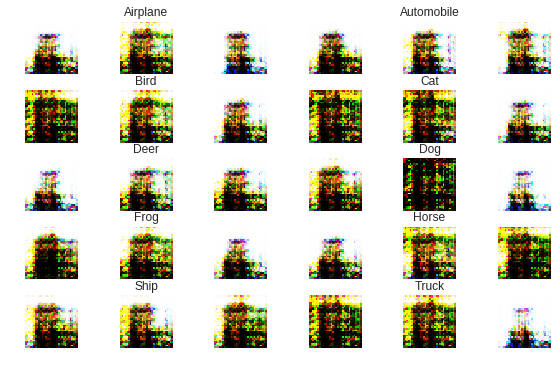

	Epoch: 38, Generator Loss: 0.0113626717186, Discriminator Loss: [0.00121026 0.        ], Time: 121.988068819


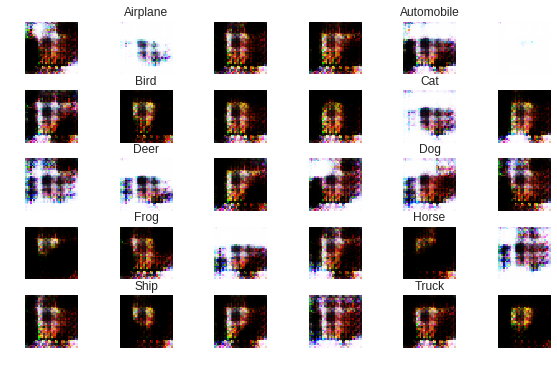

	Epoch: 39, Generator Loss: 0.00982241256714, Discriminator Loss: [0.00155955 0.        ], Time: 125.126982927


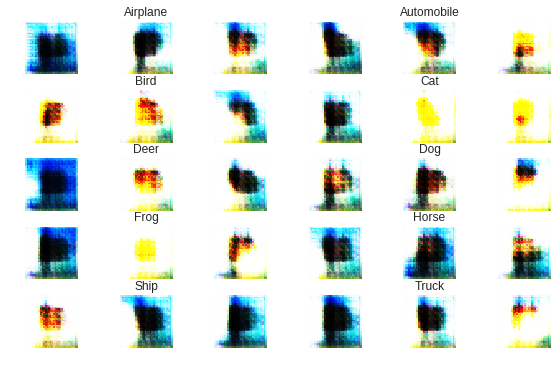

	Epoch: 40, Generator Loss: 0.00605545816422, Discriminator Loss: [0.00127969 0.        ], Time: 128.286841869


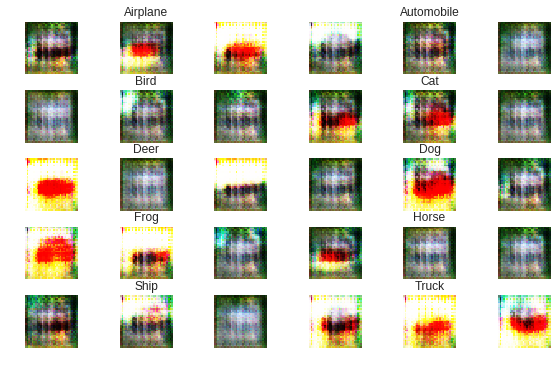

	Epoch: 41, Generator Loss: 0.0097556873703, Discriminator Loss: [0.00132365 0.        ], Time: 131.743675947


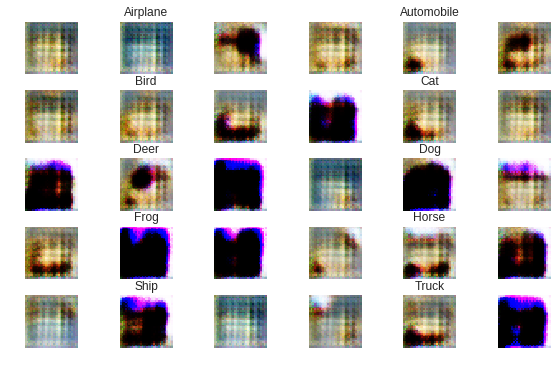

	Epoch: 42, Generator Loss: 0.0105840182495, Discriminator Loss: [0.00131492 0.        ], Time: 134.91007781


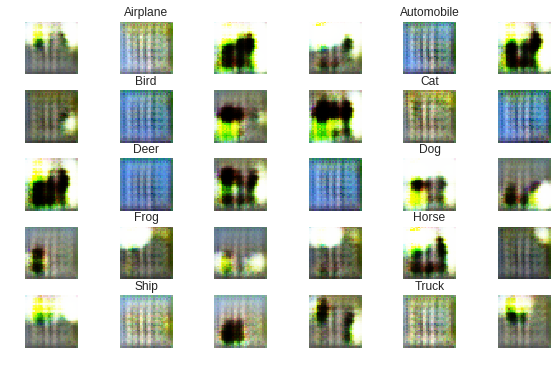

	Epoch: 43, Generator Loss: 0.0120079761887, Discriminator Loss: [0.0012995 0.       ], Time: 138.066429853


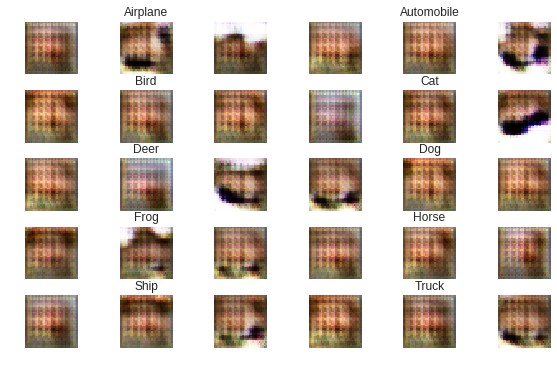

	Epoch: 44, Generator Loss: 0.0027375511241, Discriminator Loss: [0.0010793 0.       ], Time: 141.22486186


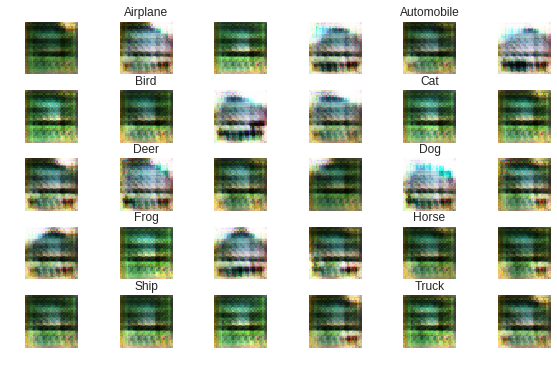

	Epoch: 45, Generator Loss: 0.00521869939327, Discriminator Loss: [0.00118029 0.        ], Time: 144.668251991


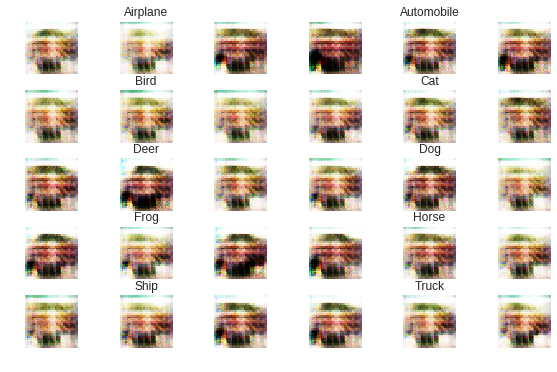

	Epoch: 46, Generator Loss: 0.0105367434311, Discriminator Loss: [0.00107227 0.        ], Time: 147.815094948


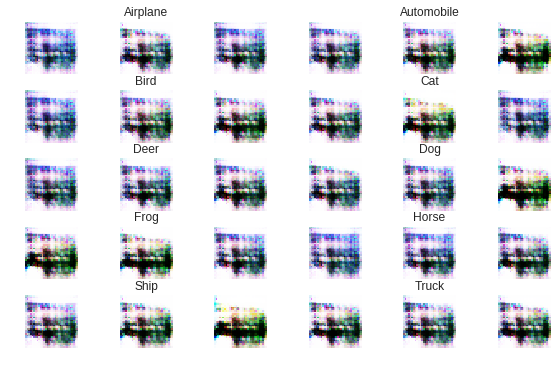

	Epoch: 47, Generator Loss: 0.01190657547, Discriminator Loss: [0.00103861 0.        ], Time: 150.961032867


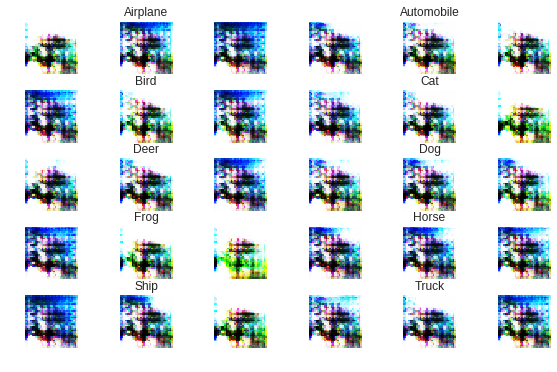

	Epoch: 48, Generator Loss: 0.0101466182709, Discriminator Loss: [0.00103434 0.        ], Time: 154.396011829


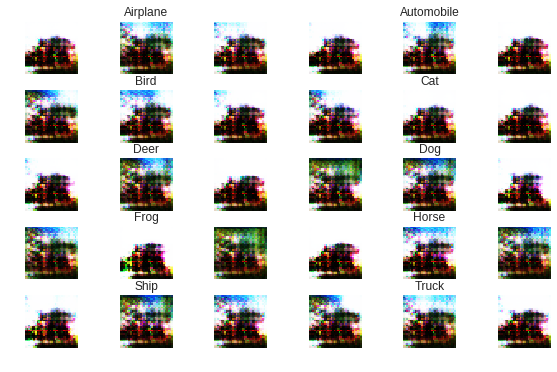

	Epoch: 49, Generator Loss: 0.0110777555466, Discriminator Loss: [0.0011633 0.       ], Time: 157.558858871


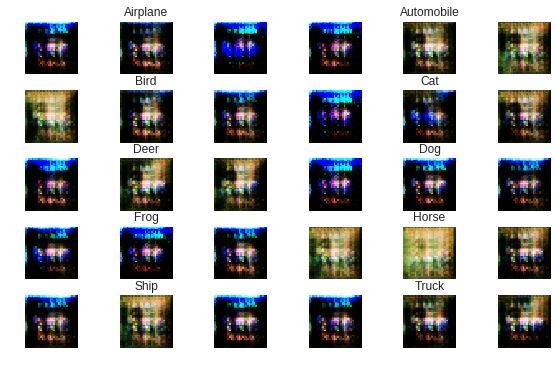

	Epoch: 50, Generator Loss: 0.00547962112904, Discriminator Loss: [0.00117565 0.        ], Time: 160.710142851


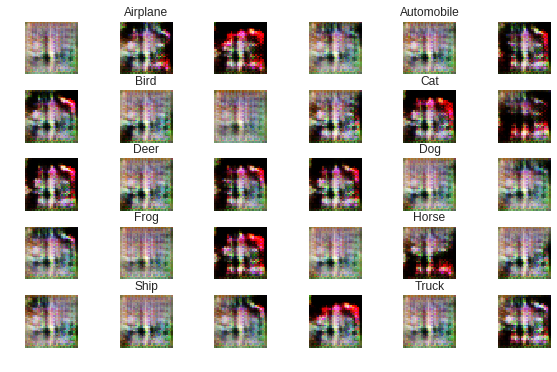

	Epoch: 51, Generator Loss: 0.0131136895752, Discriminator Loss: [0.00127248 0.        ], Time: 164.175133944


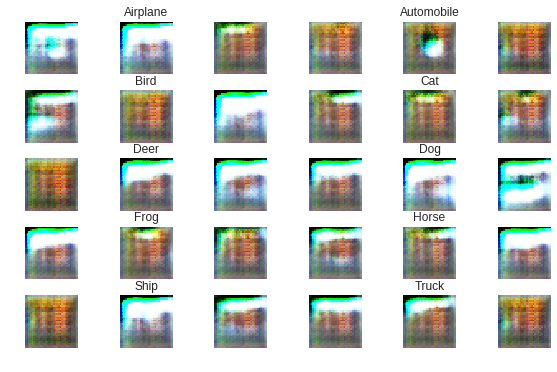

	Epoch: 52, Generator Loss: 0.0120807175446, Discriminator Loss: [0.00126345 0.        ], Time: 167.372462988


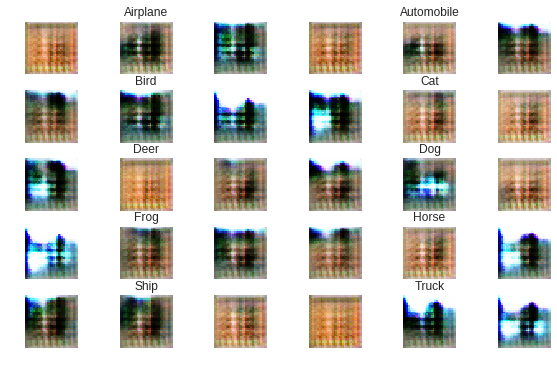

	Epoch: 53, Generator Loss: 0.0102982039642, Discriminator Loss: [0.00123235 0.        ], Time: 170.579022884


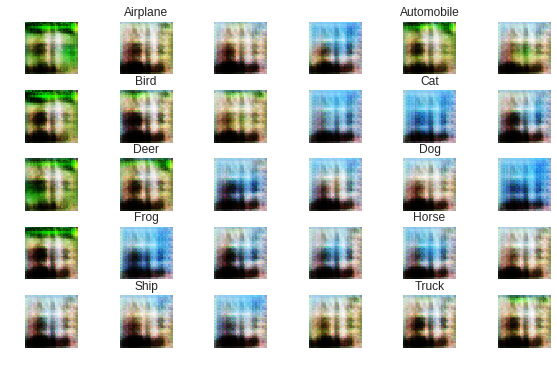

	Epoch: 54, Generator Loss: 0.00752927268982, Discriminator Loss: [0.00120305 0.        ], Time: 173.762825966


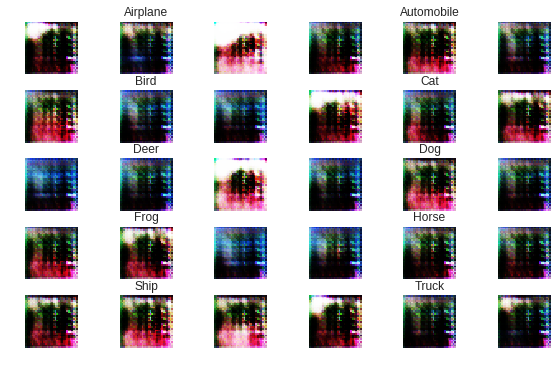

	Epoch: 55, Generator Loss: 0.0129106074524, Discriminator Loss: [0.00106376 0.        ], Time: 177.230089903


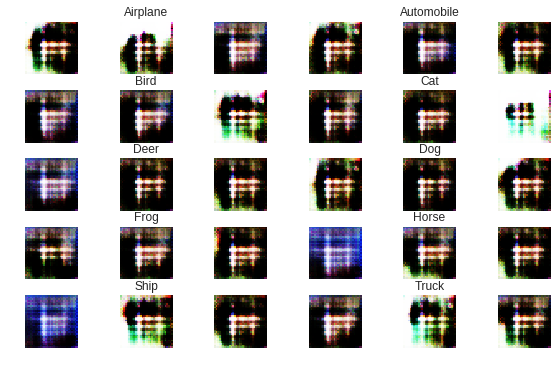

	Epoch: 56, Generator Loss: 0.0127686790466, Discriminator Loss: [0.00104842 0.        ], Time: 180.368634939


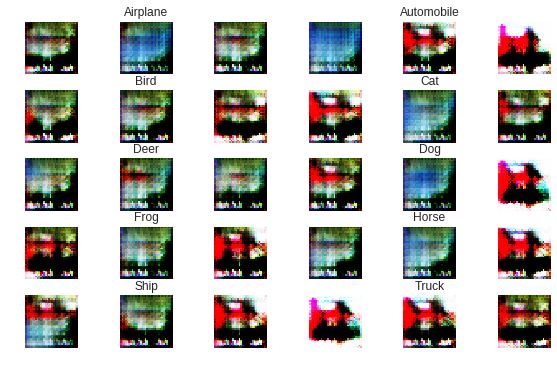

	Epoch: 57, Generator Loss: 0.0148277202606, Discriminator Loss: [0.0012109 0.       ], Time: 183.531411886


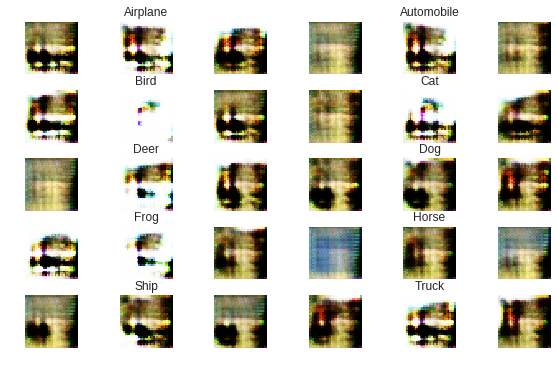

	Epoch: 58, Generator Loss: 0.0113572558212, Discriminator Loss: [0.0012445 0.       ], Time: 186.944948912


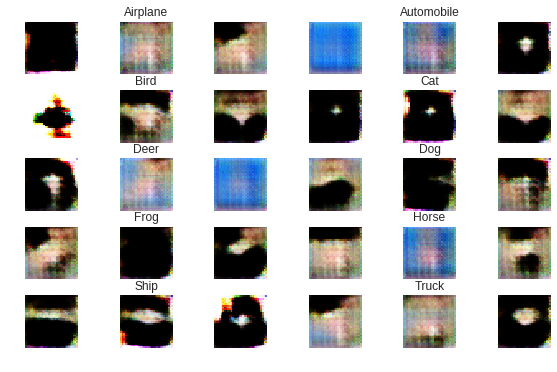

	Epoch: 59, Generator Loss: 0.0124352568436, Discriminator Loss: [0.00147946 0.        ], Time: 190.105544806


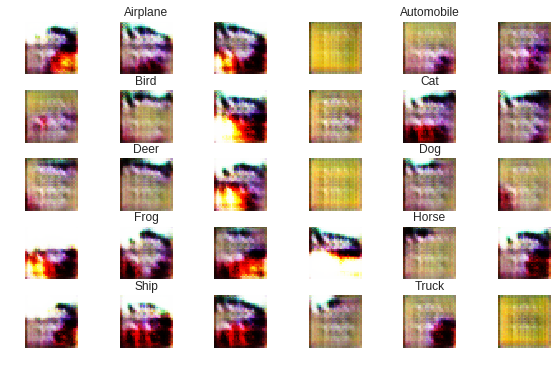

	Epoch: 60, Generator Loss: 0.0128805789948, Discriminator Loss: [0.00128156 0.        ], Time: 193.277834892


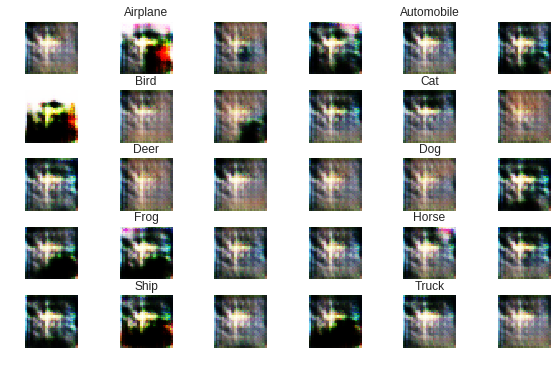

	Epoch: 61, Generator Loss: 0.00896254191399, Discriminator Loss: [0.00123616 0.        ], Time: 196.74818778


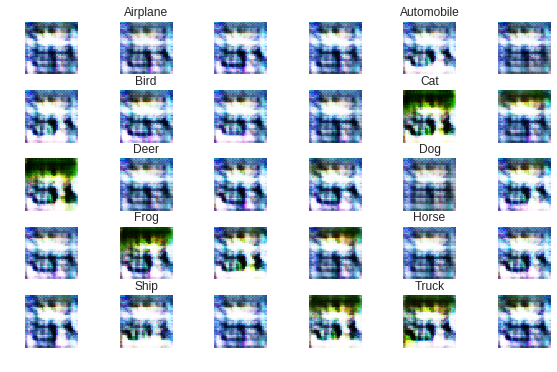

	Epoch: 62, Generator Loss: 0.0133415837097, Discriminator Loss: [0.00113908 0.        ], Time: 199.910889864


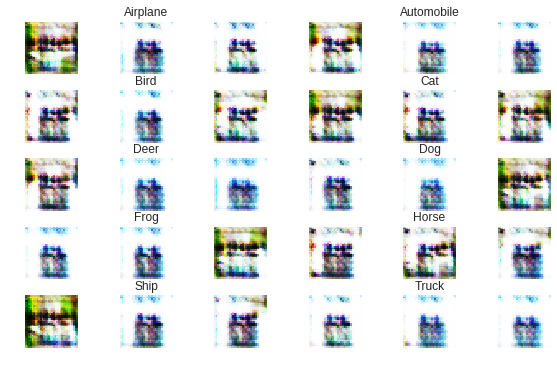

	Epoch: 63, Generator Loss: 0.0117548634338, Discriminator Loss: [0.00111965 0.        ], Time: 203.070014954


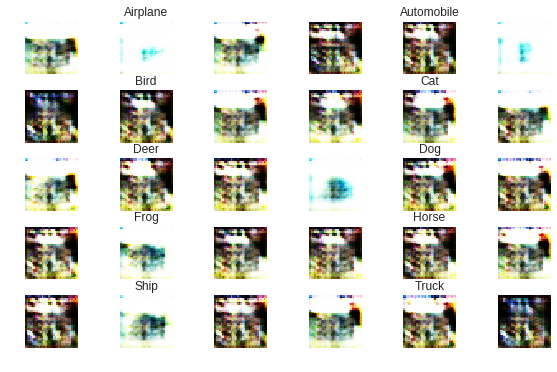

	Epoch: 64, Generator Loss: 0.0125833158875, Discriminator Loss: [0.00125351 0.        ], Time: 206.236387968


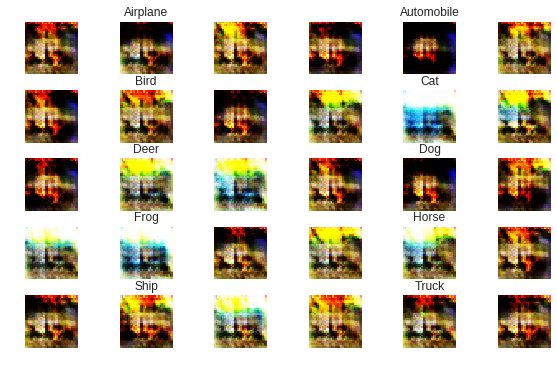

	Epoch: 65, Generator Loss: 0.0137997750092, Discriminator Loss: [0.00114476 0.        ], Time: 209.6734128


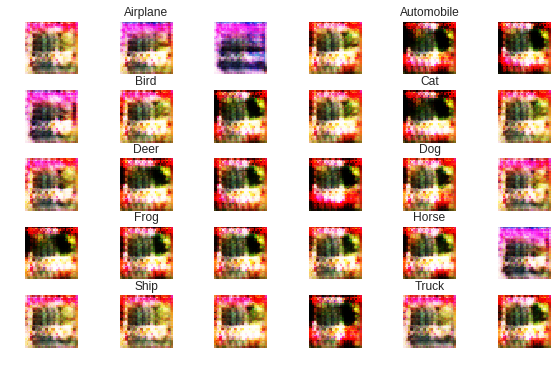

	Epoch: 66, Generator Loss: 0.0144967321777, Discriminator Loss: [0.00103973 0.        ], Time: 212.876335859


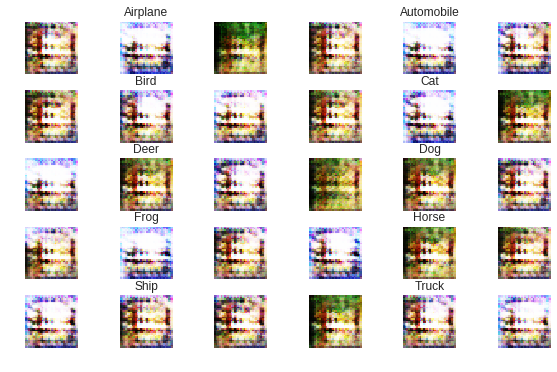

	Epoch: 67, Generator Loss: 0.0150786382294, Discriminator Loss: [0.00115388 0.        ], Time: 216.046343803


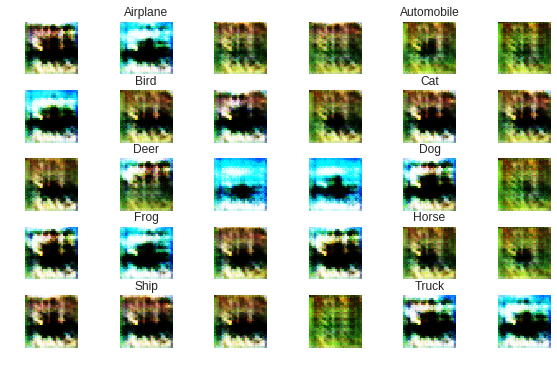

	Epoch: 68, Generator Loss: 0.0141773343658, Discriminator Loss: [0.00113545 0.        ], Time: 219.472823858


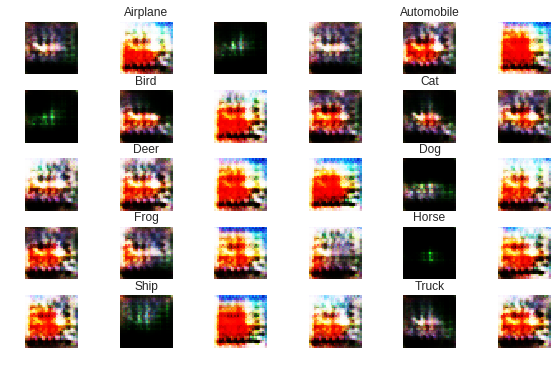

	Epoch: 69, Generator Loss: 0.0130371921158, Discriminator Loss: [0.00128436 0.        ], Time: 222.635935783


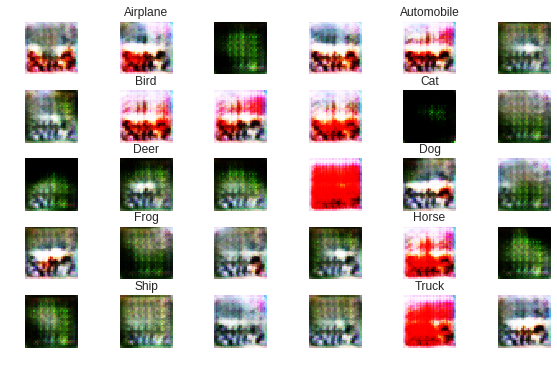

	Epoch: 70, Generator Loss: 0.0128997947311, Discriminator Loss: [0.00115443 0.        ], Time: 225.796707869


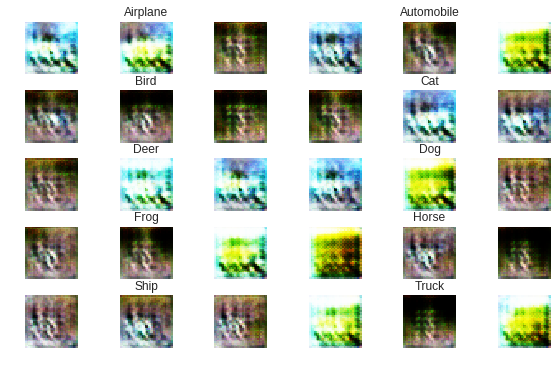

	Epoch: 71, Generator Loss: 0.0104957041931, Discriminator Loss: [0.00117156 0.        ], Time: 229.240307808


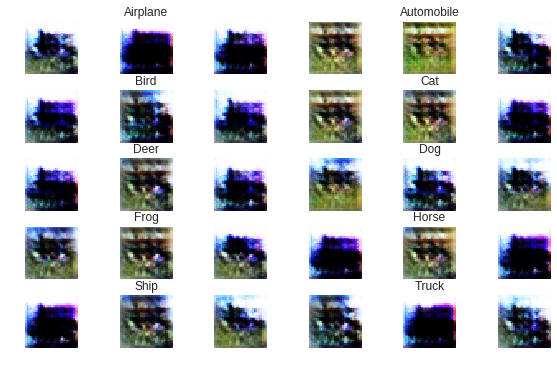

	Epoch: 72, Generator Loss: 0.0148870722198, Discriminator Loss: [0.00132038 0.        ], Time: 232.430505991


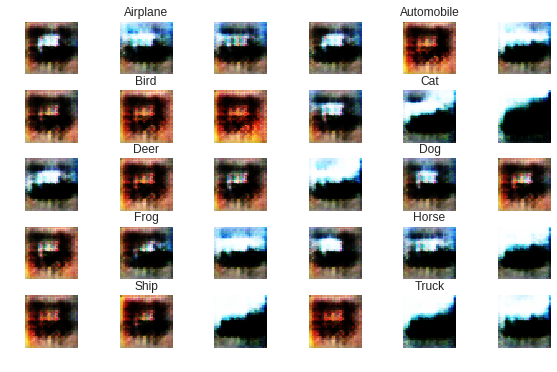

	Epoch: 73, Generator Loss: 0.0141745928955, Discriminator Loss: [0.00111543 0.        ], Time: 235.608247995


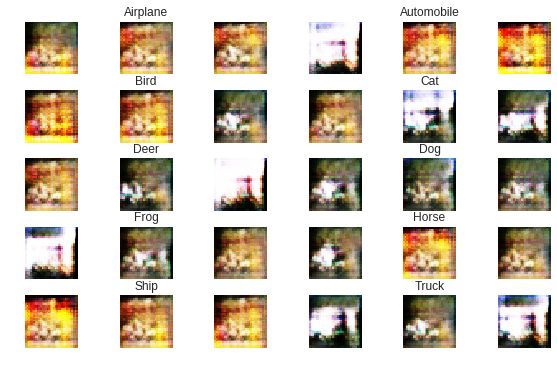

	Epoch: 74, Generator Loss: 0.0108530303955, Discriminator Loss: [0.00116744 0.        ], Time: 238.781353951


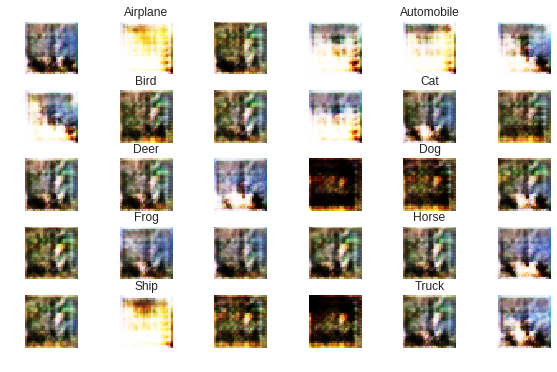

	Epoch: 75, Generator Loss: 0.0108582463741, Discriminator Loss: [0.00125147 0.        ], Time: 242.230115891


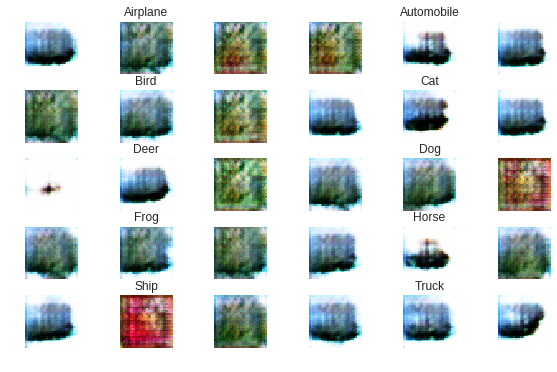

	Epoch: 76, Generator Loss: 0.0112343781662, Discriminator Loss: [0.00128691 0.        ], Time: 245.372147799


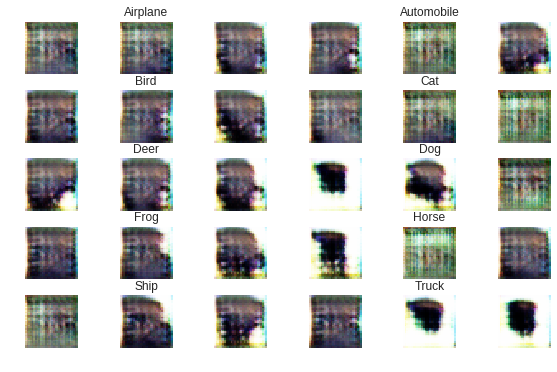

	Epoch: 77, Generator Loss: 0.00987379180908, Discriminator Loss: [0.00115975 0.        ], Time: 248.52785182


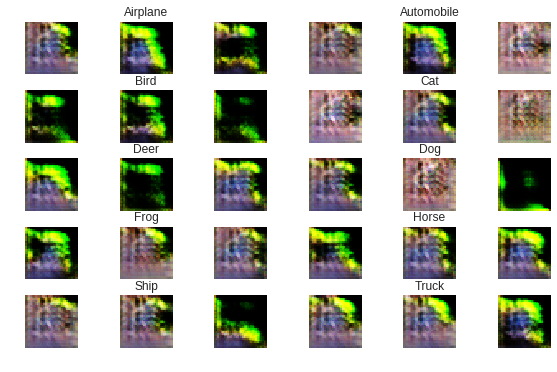

	Epoch: 78, Generator Loss: 0.00893549661636, Discriminator Loss: [0.00114167 0.        ], Time: 251.961713791


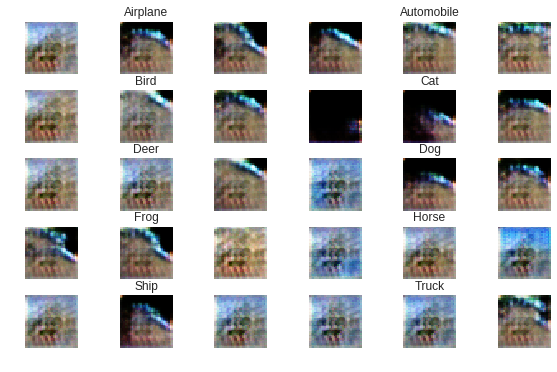

	Epoch: 79, Generator Loss: 0.0120626392746, Discriminator Loss: [0.00129296 0.        ], Time: 255.113700867


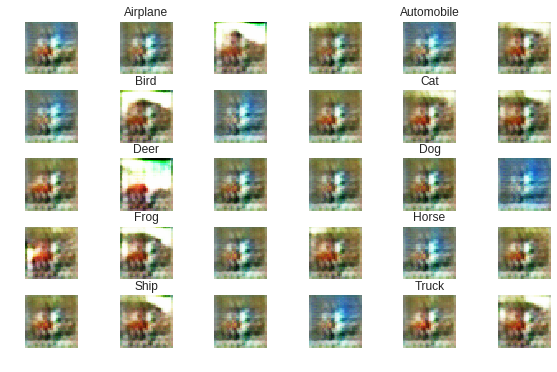

	Epoch: 80, Generator Loss: 0.0126900037003, Discriminator Loss: [0.00127927 0.        ], Time: 258.299692869


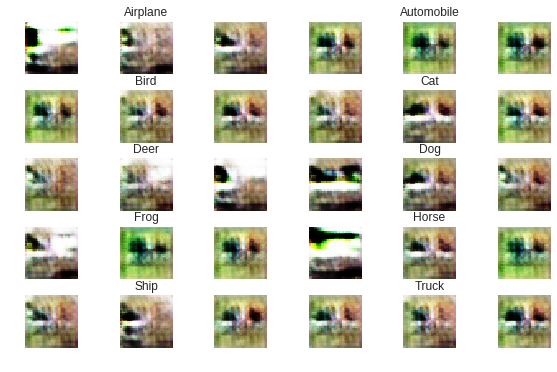

	Epoch: 81, Generator Loss: 0.010730894165, Discriminator Loss: [0.00108023 0.        ], Time: 261.762699842


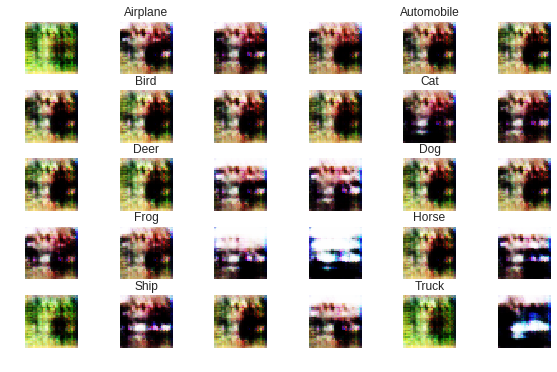

	Epoch: 82, Generator Loss: 0.0140989546204, Discriminator Loss: [0.00111233 0.        ], Time: 264.931537867


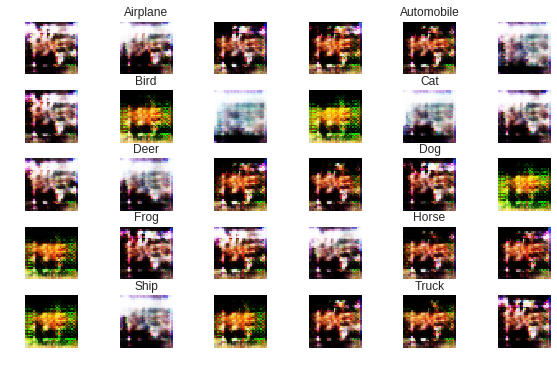

	Epoch: 83, Generator Loss: 0.0100795692635, Discriminator Loss: [0.00108712 0.        ], Time: 268.068766832


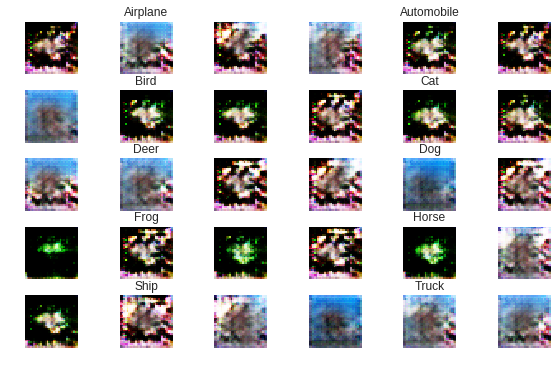

	Epoch: 84, Generator Loss: 0.0064794036293, Discriminator Loss: [0.0011272 0.       ], Time: 271.253613949


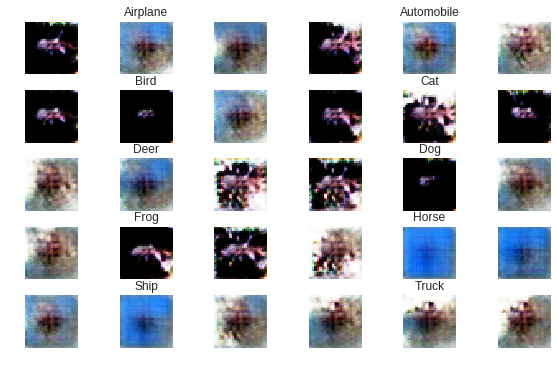

	Epoch: 85, Generator Loss: 0.00960609088898, Discriminator Loss: [0.00150889 0.        ], Time: 274.68681097


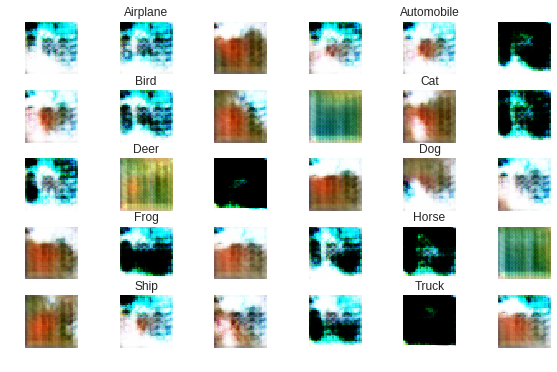

	Epoch: 86, Generator Loss: 0.011416872673, Discriminator Loss: [0.00115409 0.        ], Time: 277.829216957


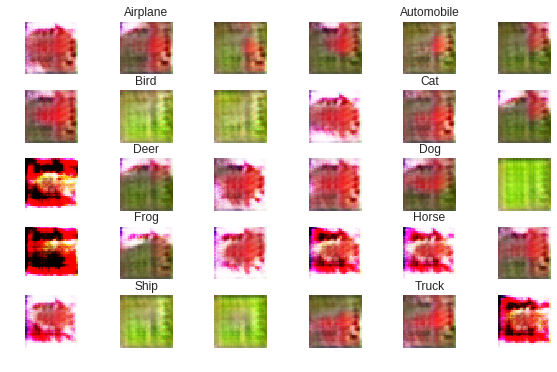

	Epoch: 87, Generator Loss: 0.0113920681381, Discriminator Loss: [0.00124573 0.        ], Time: 280.986944914


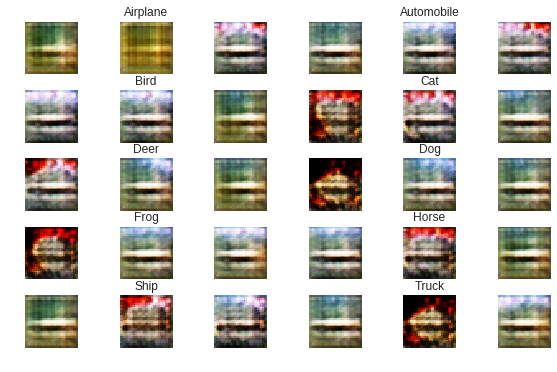

	Epoch: 88, Generator Loss: 0.0135597654724, Discriminator Loss: [0.00117947 0.        ], Time: 284.398540974


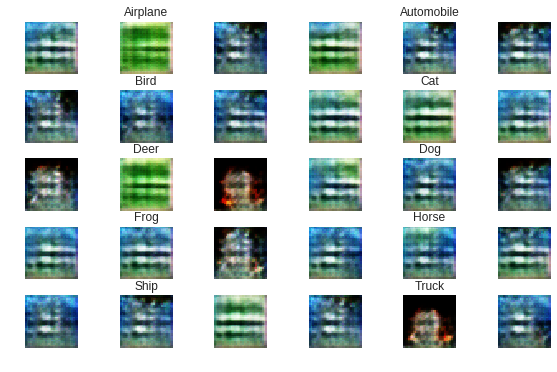

	Epoch: 89, Generator Loss: 0.0123249968719, Discriminator Loss: [0.00113534 0.        ], Time: 287.530308962


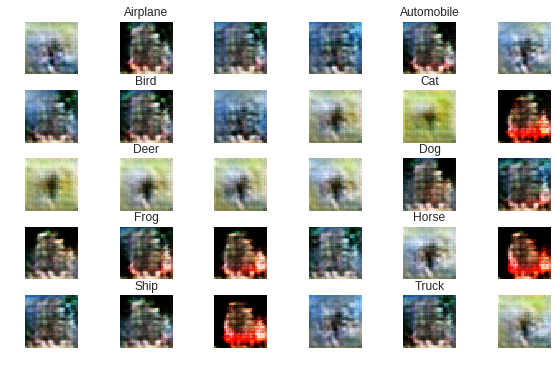

	Epoch: 90, Generator Loss: 0.0114443889236, Discriminator Loss: [0.00121667 0.        ], Time: 290.682835817


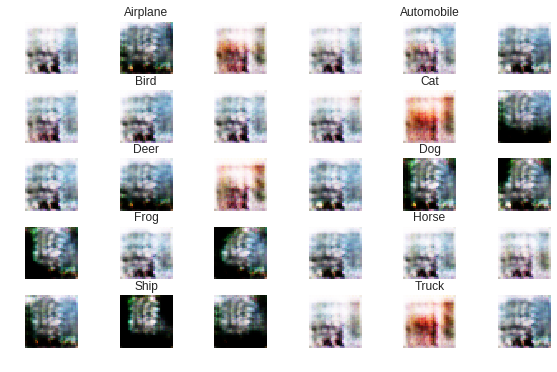

	Epoch: 91, Generator Loss: 0.0113891174316, Discriminator Loss: [0.00113039 0.        ], Time: 294.148882866


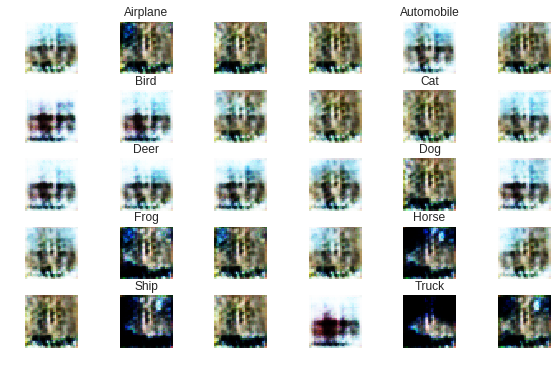

	Epoch: 92, Generator Loss: 0.0117806485367, Discriminator Loss: [0.00117249 0.        ], Time: 297.339325905


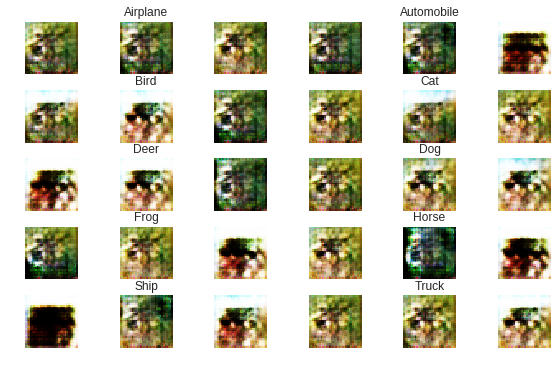

	Epoch: 93, Generator Loss: 0.0135396151733, Discriminator Loss: [0.00116842 0.        ], Time: 300.546073914


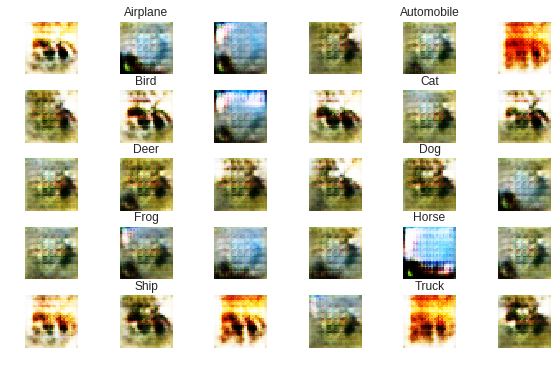

	Epoch: 94, Generator Loss: 0.0129591996765, Discriminator Loss: [0.00116089 0.        ], Time: 303.742748976


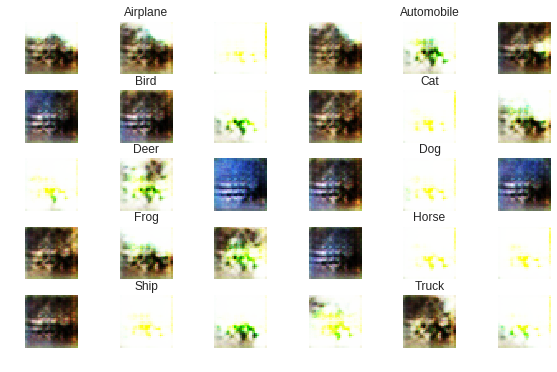

	Epoch: 95, Generator Loss: 0.0103719573212, Discriminator Loss: [0.00108653 0.        ], Time: 307.223731995


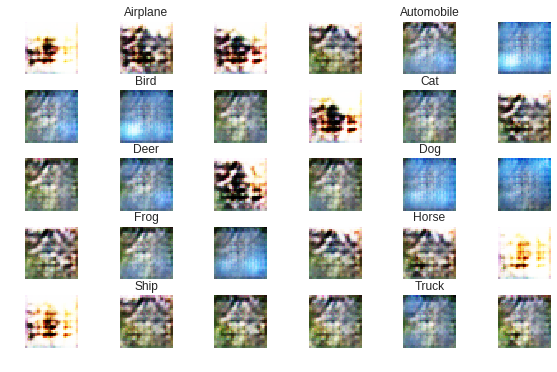

	Epoch: 96, Generator Loss: 0.0131891038895, Discriminator Loss: [0.00130955 0.        ], Time: 310.390179873


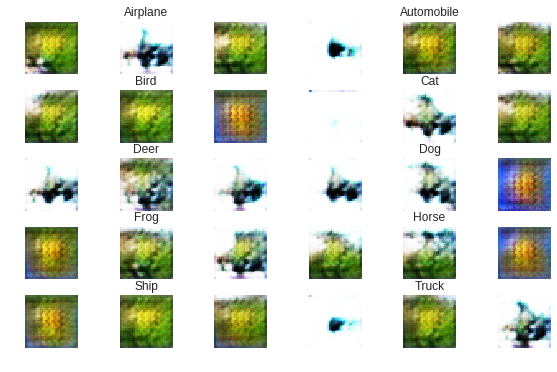

	Epoch: 97, Generator Loss: 0.012042702446, Discriminator Loss: [0.00119728 0.        ], Time: 313.546509981


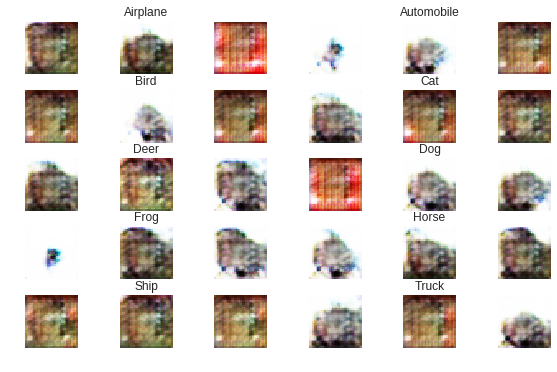

	Epoch: 98, Generator Loss: 0.011588181076, Discriminator Loss: [0.00126556 0.        ], Time: 316.969772816


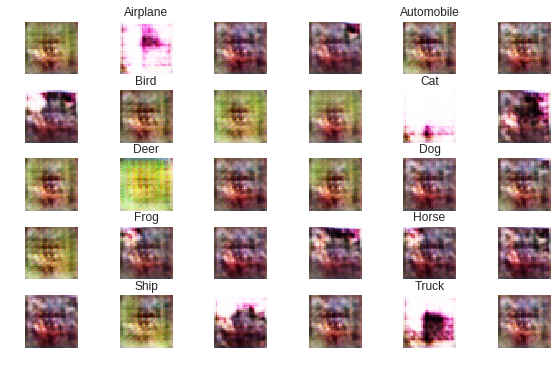

	Epoch: 99, Generator Loss: 0.013972219696, Discriminator Loss: [0.00115498 0.        ], Time: 320.126632929


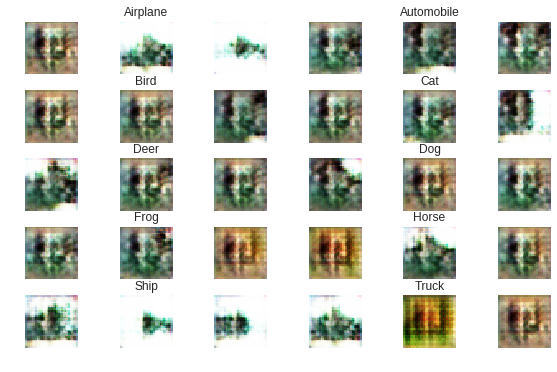

	Epoch: 100, Generator Loss: 0.0128332196808, Discriminator Loss: [0.00108721 0.        ], Time: 323.284785986


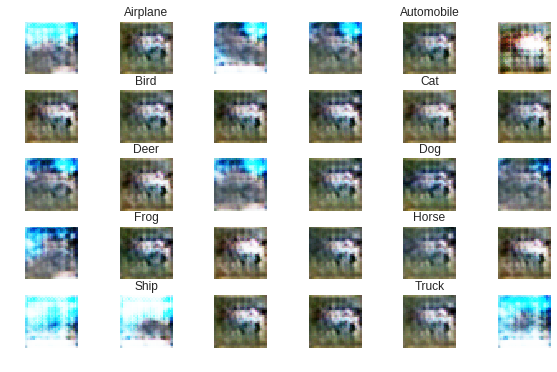

In [26]:
N_EPOCHS = 10000
start = time.time()
save_files = True
save_interval = 580
for epoch in range(N_EPOCHS):

  cum_d_loss = 0.
  cum_g_loss = 0.
  
  for batch_idx in range(num_batches):
    # Get the next set of real images to be used in this iteration
    images = X_train[batch_idx*BATCH_SIZE : (batch_idx+1)*BATCH_SIZE]
    labels = y_train[batch_idx*BATCH_SIZE : (batch_idx+1)*BATCH_SIZE]

    noise_data = generate_noise(BATCH_SIZE, 100)
    random_labels = generate_random_labels(BATCH_SIZE)
    # We use same labels for generated images as in the real training batch
    generated_images = generator.predict([noise_data, labels])

    # Train on soft targets (add noise to targets as well)
    noise_prop = 0.05 # Randomly flip 5% of targets
    
    # Prepare labels for real data
    true_labels = np.zeros((BATCH_SIZE, 1)) + np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
    flipped_idx = np.random.choice(np.arange(len(true_labels)), size=int(noise_prop*len(true_labels)))
    true_labels[flipped_idx] = 1 - true_labels[flipped_idx]
    
    # Train discriminator on real data
    d_loss_true = discriminator.train_on_batch([images, labels], true_labels)

    # Prepare labels for generated data
    gene_labels = np.ones((BATCH_SIZE, 1)) - np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
    flipped_idx = np.random.choice(np.arange(len(gene_labels)), size=int(noise_prop*len(gene_labels)))
    gene_labels[flipped_idx] = 1 - gene_labels[flipped_idx]
    
    # Train discriminator on generated data
    d_loss_gene = discriminator.train_on_batch([generated_images, labels], gene_labels)
    
    # Store a random point for experience replay
    r_idx = np.random.randint(BATCH_SIZE)
    exp_replay.append([generated_images[r_idx], labels[r_idx], gene_labels[r_idx]])
    
    #If we have enough points, do experience replay
    if len(exp_replay) == BATCH_SIZE:
      generated_images = np.array([p[0] for p in exp_replay])
      labels = np.array([p[1] for p in exp_replay])
      gene_labels = np.array([p[2] for p in exp_replay])
      expprep_loss_gene = discriminator.train_on_batch([generated_images, labels], gene_labels)
      exp_replay = []
      break
    
    d_loss = 0.5 * np.add(d_loss_true, d_loss_gene)
    cum_d_loss += d_loss

    # Train generator
    noise_data = generate_noise(BATCH_SIZE, 100)
    random_labels = generate_random_labels(BATCH_SIZE)
    g_loss = gan.train_on_batch([noise_data, random_labels, random_labels], np.zeros((BATCH_SIZE, 1)))
    cum_g_loss += g_loss

  print('\tEpoch: {}, Generator Loss: {}, Discriminator Loss: {}, Time: {}'.format(epoch+1, cum_g_loss/num_batches, cum_d_loss/num_batches, time.time()-start))
  show_samples("epoch" + str(epoch))
  
  if save_files and (epoch+1)%save_interval == 0:
    files.download("discriminator.h5")
    files.download("generator.h5")
    print("Models saved")


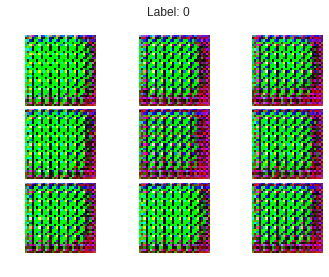

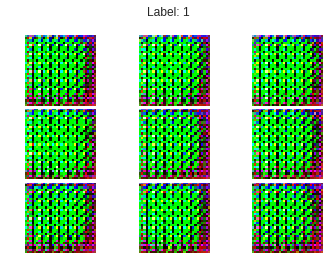

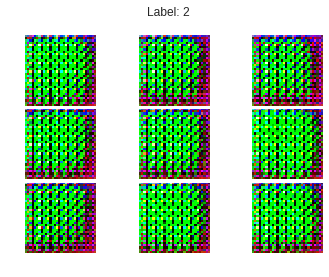

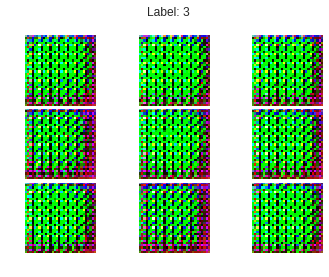

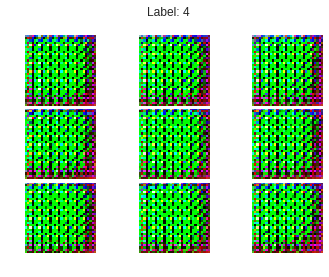

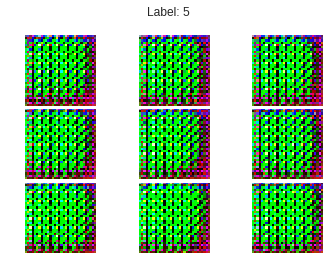

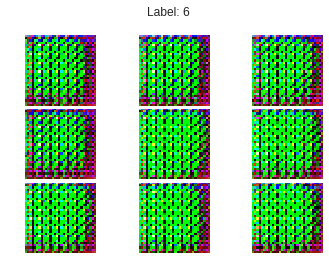

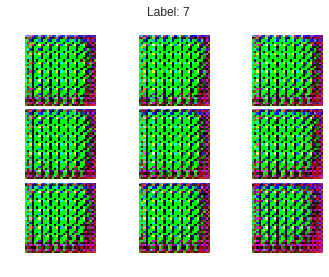

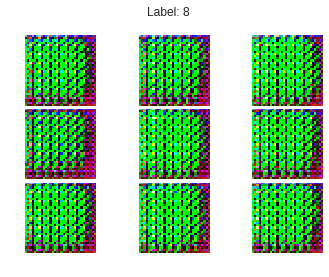

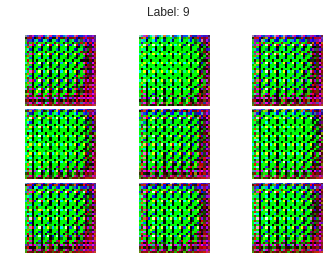

In [9]:
for classlabel in range(10):
  lbls = one_hot_encode([classlabel] * 9)
  noise = generate_noise(9, 100)
  gen_imgs = generator.predict([noise, lbls])

  fig, axs = plt.subplots(3, 3)
  plt.subplots_adjust(hspace=0.05, wspace=0.05)
  count = 0
  for i in range(3):
    for j in range(3):
      # Dont scale the images back, let keras handle it
      img = image.array_to_img(gen_imgs[count], scale=True)
      axs[i,j].imshow(img)
      axs[i,j].axis('off')
      plt.suptitle('Label: ' + str(classlabel))
      count += 1
  plt.show()
  plt.close()  

In [0]:
generator.save("generator.h5")
discriminator.save("discriminator.h5")

In [0]:
from google.colab import files



In [21]:
start = time.time()
for i in range(2):
  files.download("discriminator.h5")
  print(time.time()-start)

72.2260348797
146.233091831
